In [7]:
import os
import torch
from deepface import DeepFace
device = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
with open('/home/chengping/cse291/project/prompts_human.txt') as f:
    lines = f.readlines()
    lines = [eval(line.strip()) for line in lines][:20]

In [5]:
import clip
from clipscore import get_clip_score, extract_all_images
model, _ = clip.load("ViT-B/32", device=device, jit=False)
model.eval()
print()

In [9]:
genBaseDir = '/home/chengping/Dreambooth-Stable-Diffusion/outputs'
contentBaseDir = '/home/chengping/Dreambooth-Stable-Diffusion/celebA/images'
prompts = [l["new_prompt"].replace(' {user}', '') for l in lines]

In [ ]:
total_scores = []
for pt in range(20):
    styleFiles = []
    for user in [1,2,5,9]:
        
        contentDir = os.path.join(contentBaseDir, f'user{user:02}')
        contentFiles = [os.path.join(contentDir, i) for i in os.listdir(contentDir) if i[-1] =='g']
        
        genDir = os.path.join(genBaseDir, f'prompt{pt:02}-user{user:02}', 'samples')
        genFiles = [os.path.join(genDir, i) for i in os.listdir(genDir) if i[-1] == 'g']
        gen_feats = extract_all_images(genFiles, model, device, batch_size=64, num_workers=8)
        _, style_sim, _ = get_clip_score(model, gen_feats, [prompts[pt]] * len(genFiles), device)
        
        
        content_sim = []
        for g in genFiles:
            s = 0
            for c in contentFiles:
                s += 1 - DeepFace.verify(img1_path=g, img2_path=c, enforce_detection=False, prog_bar=False)["distance"]
            content_sim.append(s / len(contentFiles))
            
        total_scores += list(zip(genFiles, style_sim, content_sim))

In [1]:
with open('eval.txt') as f:
    lines = f.readlines()
    lines = [line.strip().split('\t') for line in lines]

In [29]:
from PIL import Image
from IPython.display import display
import shutil
import os

In [26]:
lines[0]

['/home/chengping/Dreambooth-Stable-Diffusion/outputs/prompt00-user01/samples/00013.jpg',
 '0.734375',
 '0.3831557760745018']

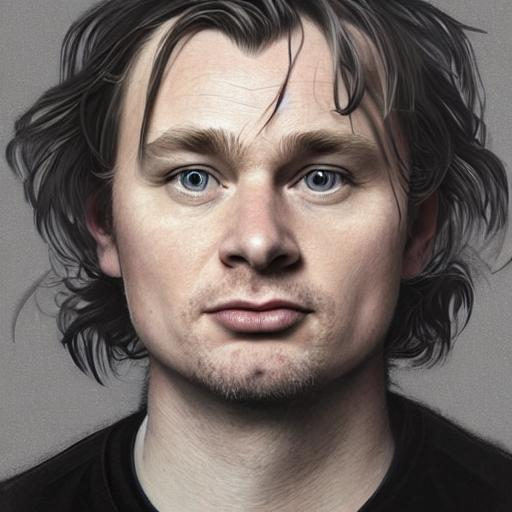

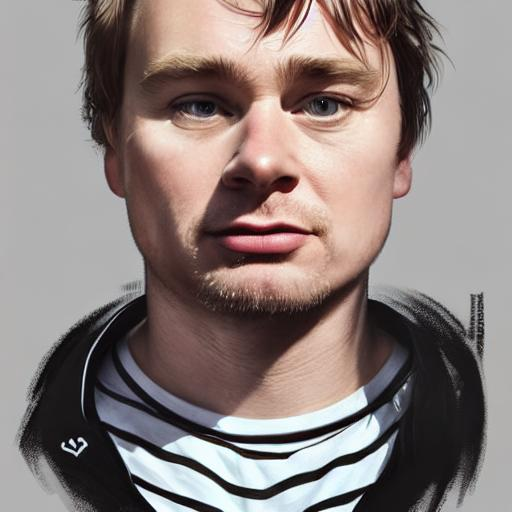

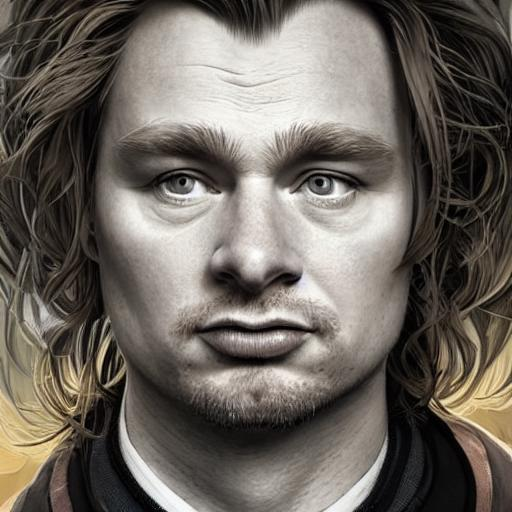

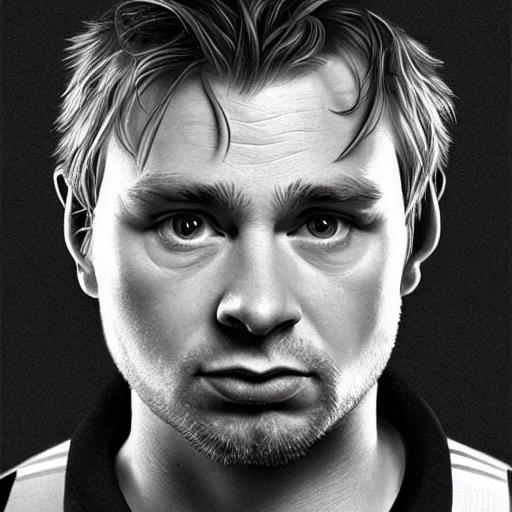

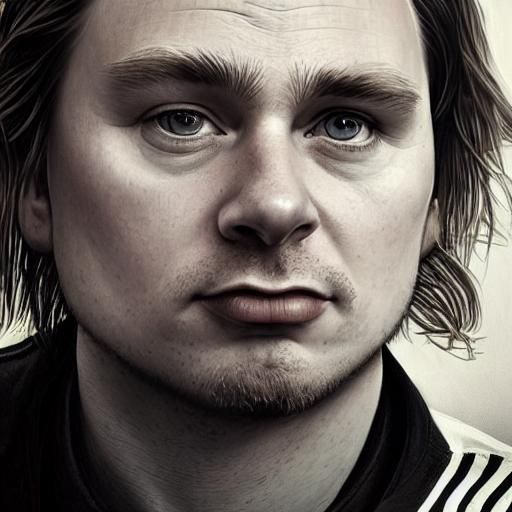

...

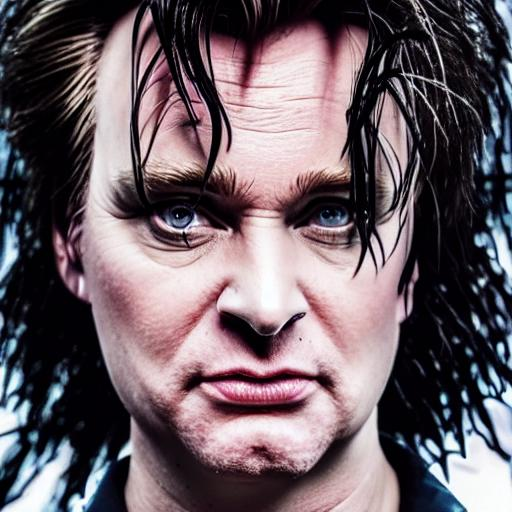

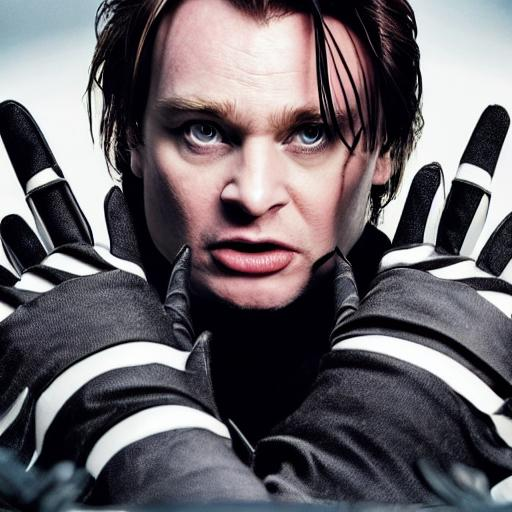

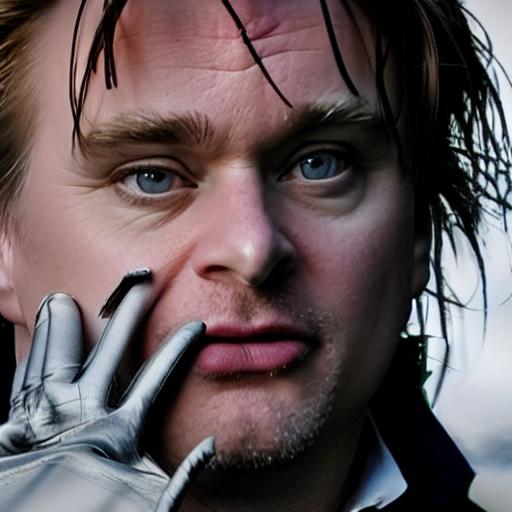

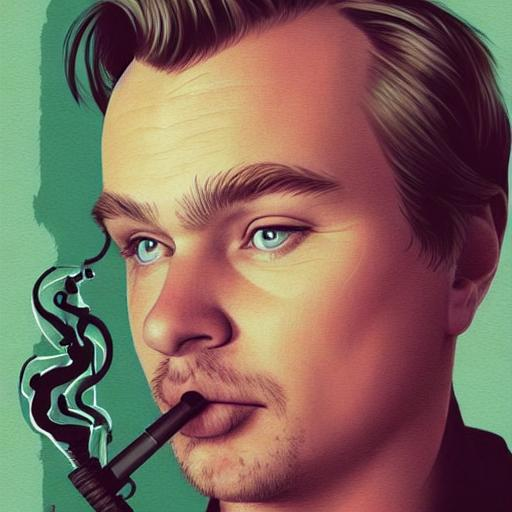

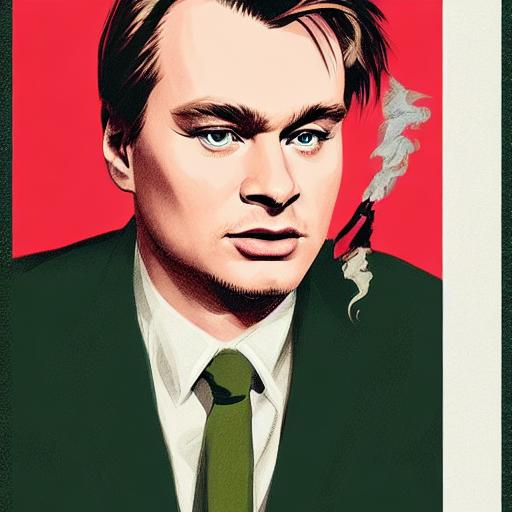

In [48]:
for line in lines:
    filename, style, content = line
    if float(style) > 0.7 and float(content) > 0.6 and 'user09' in filename:
        # folder = '/'.join(filename.split('/')[:-2]) + '-valid/samples' 
        # os.makedirs(folder, exist_ok=True)
        # shutil.copy2(filename, folder)
        filename = filename.replace('outputs', 'outputs-baseline')
        display(Image.open(filename))